# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!ls drive/'My Drive'/appliedaidocs

3.concertriccir2.csv  glove.42B.300d.zip  train_data.csv
database.sqlite       resources.csv


## 1.1 Reading Data

In [0]:
project_data = pd.read_csv('drive/My Drive/appliedaidocs/train_data.csv')
resource_data = pd.read_csv('drive/My Drive/appliedaidocs/resources.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [0]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [0]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [0]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [0]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [0]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations.     The materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills.   They also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing. Phys

In [0]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays cognitive delays gross fine motor delays to autism They are eager beavers and always strive to work their hardest working past their limitations The materials we have are the ones I seek out for my students I teach in a Title I school where most of the students receive free or reduced price lunch Despite their disabilities and limitations my students love coming to school and come eager to learn and explore Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting This is how my kids feel all the time The want to be able to move as they learn or so they say Wobble chairs are the answer and I love then because they develop their core which enhances gross motor and in Turn fine motor skills They also want to learn through games my kids do not want to sit and do worksheets They want to learn to count by jumping and playing Physical engagement is the

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 109248/109248 [01:06<00:00, 1653.22it/s]


In [0]:
# after preprocesing
preprocessed_essays[20000]

'my kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism they eager beavers always strive work hardest working past limitations the materials ones i seek students i teach title i school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore have ever felt like ants pants needed groove move meeting this kids feel time the want able move learn say wobble chairs answer i love develop core enhances gross motor turn fine motor skills they also want learn games kids not want sit worksheets they want learn count jumping playing physical engagement key success the number toss color shape mats make happen my students forget work fun 6 year old deserves nannan'

In [0]:
project_data["preprocessed_essays"] = preprocessed_essays
project_data = project_data.drop('essay', axis=1)
project_data = project_data.drop('project_essay_1', axis=1)
project_data = project_data.drop('project_essay_2', axis=1)
project_data = project_data.drop('project_essay_3', axis=1)
project_data = project_data.drop('project_essay_4', axis=1)



<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [0]:
# similarly you can preprocess the titles also
preprocessed_titles = []
for sentence in tqdm(project_data['project_title'].values):
  sent = decontracted(sentence)
  sent = sent.replace('\\r', ' ')
  sent = sent.replace('\\n', ' ')
  sent = sent.replace('\\"', ' ')
  sent = re.sub('[^A-Za-z0-0]+',' ', sent)
  sent = ' '.join(e for e in sent.split() if e not in stopwords)
  preprocessed_titles.append(sent.lower().strip())
print("\n",preprocessed_titles[2321])


100%|██████████| 109248/109248 [00:03<00:00, 34465.32it/s]


 read it again building passion reading via listening centers


In [0]:
project_data['preprocessed_titles'] = preprocessed_titles
project_data = project_data.drop('project_title', axis =1)

# Assignment 8: DT

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical, numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical, numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>Hyper paramter tuning (best `depth` in range [1, 5, 10, 50, 100, 500, 100], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li> 
        </ul>
    </li>
    <br>
    <li><strong>Graphviz</strong>
        <ul>
    <li>Visualize your decision tree with Graphviz. It helps you to understand how a decision is being made, given a new vector.</li>
    <li>Since feature names are not obtained from word2vec related models, visualize only BOW & TFIDF decision trees using Graphviz</li>
    <li>Make sure to print the words in each node of the decision tree instead of printing its index.</li>
    <li>Just for visualization purpose, limit max_depth to 2 or 3 and either embed the generated images of graphviz in your notebook, or directly upload them as .png files.</li>                
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='train_cv_auc.JPG' width=300px></li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud <a href='https://www.geeksforgeeks.org/generating-word-cloud-python/' with the words of eassy text of these `false positive data points`>WordCloud</a></li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>[Task-2]</strong>
        <ul>
    <li> Select 5k best features from features of <font color='red'>Set 2</font> using<a href='https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html'>`feature_importances_`</a>, discard all the other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3</li>
        </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

## 1.5 Preparing data for models

In [0]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_titles'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

<h1>2. Decision Tree </h1>

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [0]:
class_label = project_data['project_is_approved']
features = project_data.drop('project_is_approved', axis=1)

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

from sklearn.model_selection import train_test_split    
#20% data used for testing set
X_train, X_test, y_train, y_test = train_test_split(features, class_label, test_size = 0.2, random_state=42, stratify= class_label)


print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


print(project_data.shape)      

(87398, 13)
(21850, 13)
(87398,)
(21850,)
(109248, 14)


<h2>2.2 Make Data Model Ready: Categorical features</h2>

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding 
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

feature_names = []  #This list stores the feature names which can be used while using graphviz

# we use count vectorizer to convert the values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_categories'].values)
print(vectorizer.get_feature_names())
clean_categories = vectorizer.get_feature_names()
#print(list(sorted_sub_cat_dict.keys()))
feature_names = clean_categories

#vectorizing clean_categories
categories_one_hot = vectorizer.transform(X_train['clean_categories'].values)
categories_one_hot_test = vectorizer.transform(X_test['clean_categories'].values)



#print(categories_one_hot)
print("Shape of matrix after one hot encodig ",categories_one_hot.shape)
print("Shape of test matrix after one hot encodig ",categories_one_hot_test.shape)


#################################################################################################################

# we use count vectorizer to convert the values into one hot encoded features
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_subcategories'].values)
print(vectorizer.get_feature_names())
clean_subcategories = vectorizer.get_feature_names()
#vectorizing clean_subcategories
feature_names.extend(clean_subcategories)

subcategories_one_hot = vectorizer.transform(X_train['clean_subcategories'].values)

subcategories_one_hot_test = vectorizer.transform(X_test['clean_subcategories'].values)
print("Shape of train matrix after one hot encodig ",subcategories_one_hot.shape)

print("Shape of test matrix after one hot encodig ",subcategories_one_hot_test.shape)

#################################################################################################################


from collections import Counter
my_counter = Counter()
for word in X_train['school_state'].values:
    my_counter.update(word.split())

state_dict = dict(my_counter)
sorted_state_dict = dict(sorted(state_dict.items(), key=lambda kv: kv[1]))

vectorizer = CountVectorizer(vocabulary=list(sorted_state_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['school_state'].values)
print(vectorizer.get_feature_names())
school_state = vectorizer.get_feature_names()

feature_names.extend(school_state)
#vectorizing school state categories
school_state_categories_one_hot = vectorizer.transform(X_train['school_state'].values)
print("Shape of train matrix after one hot encoding", school_state_categories_one_hot.shape)

school_state_categories_one_hot_test = vectorizer.transform(X_test['school_state'].values)
print("Shape of test matrix after one hot encoding", school_state_categories_one_hot_test.shape)


#################################################################################################################


# Please do the similar feature encoding with state, teacher_prefix and project_grade_category also
#For filering out NaN values
X_train['teacher_prefix'] = X_train['teacher_prefix'].fillna("")
X_test['teacher_prefix'] = X_test['teacher_prefix'].fillna("")

from collections import Counter
my_counter = Counter()
for word in X_train['teacher_prefix'].values:
    my_counter.update(word.split())

teacher_prefix_dict = dict(my_counter)
sorted_teacher_prefix_dict = dict(sorted(teacher_prefix_dict.items(), key=lambda kv: kv[1]))

vectorizer = CountVectorizer(vocabulary=list(sorted_teacher_prefix_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['teacher_prefix'].values)
print(vectorizer.get_feature_names())
teacher_prefix = vectorizer.get_feature_names()

feature_names.extend(teacher_prefix)
#vectorizing teacher_prefix
teacher_prefix_categories_one_hot = vectorizer.transform(X_train['teacher_prefix'].values)
print("Shape of train matrix after one hot encoding", teacher_prefix_categories_one_hot.shape)

teacher_prefix_categories_one_hot_test = vectorizer.transform(X_test['teacher_prefix'].values)
print("Shape of test matrix after one hot encoding", teacher_prefix_categories_one_hot_test.shape)

#################################################################################################################



# Please do the similar feature encoding with state, teacher_prefix and project_grade_category also
#For filering out NaN values
X_train['project_grade_category'] = X_train['project_grade_category'].fillna("")
X_test['project_grade_category'] = X_test['project_grade_category'].fillna("")

from collections import Counter
my_counter = Counter()
for word in X_train['project_grade_category'].values:
    my_counter.update(word.split('  '))

proj_grade_cat_dict = dict(my_counter)
sorted_proj_grade_cat_dict = dict(sorted(proj_grade_cat_dict.items(), key=lambda kv: kv[1]))

vectorizer = CountVectorizer(vocabulary=list(sorted_proj_grade_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['project_grade_category'].values)

project_grade_category = vectorizer.get_feature_names()
print(project_grade_category)

feature_names.extend(project_grade_category)
#vectorizing project_grade_categories
project_grade_categories_one_hot = vectorizer.transform(X_train['project_grade_category'].values)
print("Shape of matrix after one hot encoding", project_grade_categories_one_hot.shape)

project_grade_categories_one_hot_test = vectorizer.transform(X_test['project_grade_category'].values)
print("Shape of test matrix after one hot encoding", project_grade_categories_one_hot_test.shape)

    

    
#################################################################################################################
#################################################################################################################
#################################################################################################################



price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
    
X_train = pd.merge(X_train, price_data, on='id', how='inner')

X_test = pd.merge(X_test, price_data, on='id', how='inner')

feature_names.append('price')
feature_names.append('quantity')
feature_names.append('teacher_number_prev_projects')
X_train.head(2)

print("Length of feature names list:",len(feature_names))

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig  (87398, 9)
Shape of test matrix after one hot encodig  (21850, 9)
['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of train matrix after one hot encodig  (87398, 30)
Shape of test matrix after one hot encodig  (21850, 30)
['VT', 'WY', 'ND', 'MT', 'RI', 'NE', 'SD', 'AK', 'NH', 'DE', 'ME', 'HI', 'WV', 'DC', 'NM', 'KS', 'IA', 'ID', 'AR',

### Converting Numerical dataframe columns to arrays

In [0]:
#We don't need to standardize or normalize the numerical data in Decision Trees
price_train = np.array(X_train['price']).reshape(-1,1)
quantity_train = np.array(X_train['quantity']).reshape(-1,1)
teacher_number_train = np.array(X_train['teacher_number_of_previously_posted_projects']).reshape(-1,1)

In [0]:
price_test = np.array(X_test['price']).reshape(-1,1)
quantity_test = np.array(X_test['quantity']).reshape(-1,1)
teacher_number_test = np.array(X_test['teacher_number_of_previously_posted_projects']).reshape(-1,1)

### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

In [0]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer_bow = CountVectorizer(min_df=10, max_features = 5000, ngram_range=(1, 2))
text_bow = vectorizer_bow.fit_transform(X_train['preprocessed_essays'])
text_bow_test = vectorizer_bow.transform(X_test['preprocessed_essays'])
print("Shape of matrix after one hot encodig ",text_bow.shape)
print("Shape of test matrix after one hot encodig ",text_bow_test.shape)


Shape of matrix after one hot encodig  (87398, 5000)
Shape of test matrix after one hot encodig  (21850, 5000)


In [0]:
# you can vectorize the title also 
# before you vectorize the title make sure you preprocess it
vectorizer_bow_title = CountVectorizer(min_df=10)
title_bow = vectorizer_bow_title.fit_transform(X_train['preprocessed_titles'])

title_bow_test = vectorizer_bow_title.transform(X_test['preprocessed_titles'])

print("Shape of matrix after OHE", title_bow.shape)

print("Shape of test matrix after OHE", title_bow_test.shape)

Shape of matrix after OHE (87398, 2911)
Shape of test matrix after OHE (21850, 2911)


#### 1.5.2.2 TFIDF vectorizer

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_tfidf = TfidfVectorizer(min_df=10, max_features = 5000, ngram_range=(1, 2))
text_tfidf = vectorizer_tfidf.fit_transform(X_train['preprocessed_essays'])
print("Shape of matrix after one hot encodig ",text_tfidf.shape)

text_tfidf_test = vectorizer_tfidf.transform(X_test['preprocessed_essays'])
print("Shape of test matrix after one hot encodig ",text_tfidf_test.shape)

print(len(vectorizer_tfidf.get_feature_names()))


Shape of matrix after one hot encodig  (87398, 5000)
Shape of test matrix after one hot encodig  (21850, 5000)
5000


In [0]:
# Similarly you can vectorize for title also
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_tfidf_title = TfidfVectorizer(min_df=10)
title_tfidf = vectorizer_tfidf_title.fit_transform(X_train['preprocessed_titles'])
print("Shape of matrix after OHE", title_tfidf.shape)

title_tfidf_test = vectorizer_tfidf_title.transform(X_test['preprocessed_titles'])
print("Shape of test matrix after OHE", title_tfidf_test.shape)

Shape of matrix after OHE (87398, 2911)
Shape of test matrix after OHE (21850, 2911)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [0]:
 !ls drive/'My Drive'/appliedaidocs/

3.concertriccir2.csv  database.sqlite  resources.csv  train_data.csv


In [0]:
!unzip "drive/My Drive/appliedaidocs/glove.42B.300d.zip"

Archive:  drive/My Drive/appliedaidocs/glove.42B.300d.zip
  inflating: glove.42B.300d.txt      


In [0]:
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')
'''
# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================
'''
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/


808it [00:00, 8079.72it/s]

Loading Glove Model


1917495it [03:30, 9096.60it/s]


Done. 1917495  words loaded!


'\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n'

In [0]:
words = []
for i in X_train['preprocessed_essays']:
    words.extend(i.split(' '))

for i in X_train['preprocessed_titles']:
    words.extend(i.split(' '))
print("all the words in the courpus", len(words))
words = set(words)
print("the unique words in the courpus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
print(len(model.keys()))

for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))

all the words in the courpus 13605159
the unique words in the courpus 53870
The number of words that are present in both glove vectors and our coupus 47733 ( 88.608 %)
1917495
word 2 vec length 47733


In [0]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)

with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [0]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)
   
avg_w2v_vectors = np.array(avg_w2v_vectors)


100%|██████████| 87398/87398 [00:36<00:00, 2391.27it/s]


In [0]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)
   
avg_w2v_vectors_test = np.array(avg_w2v_vectors_test)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0]))

100%|██████████| 21850/21850 [00:09<00:00, 2273.74it/s]

21850
300


In [0]:
# Similarly you can vectorize for title also
avg_w2v_vectors_titles = []
for sentence in tqdm(X_train['preprocessed_titles']):
  vector = np.zeros(300)
  cnt_words = 0
  for word in sentence.split():
    if word in glove_words:
      vector += model[word]
      cnt_words += 1
  if cnt_words !=0:
     vector /=cnt_words
  avg_w2v_vectors_titles.append(vector)
  
avg_w2v_vectors_titles = np.array(avg_w2v_vectors_titles)
print(avg_w2v_vectors_titles.shape)
    
print(len(avg_w2v_vectors_titles))
print(len(avg_w2v_vectors_titles[0]))

100%|██████████| 87398/87398 [00:01<00:00, 52748.44it/s]


(87398, 300)
87398
300


In [0]:
# Similarly you can vectorize for title also
avg_w2v_vectors_titles_test = []
for sentence in tqdm(X_test['preprocessed_titles']):
  vector = np.zeros(300)
  cnt_words = 0
  for word in sentence.split():
    if word in glove_words:
      vector += model[word]
      cnt_words += 1
  if cnt_words !=0:
     vector /=cnt_words
  avg_w2v_vectors_titles_test.append(vector)
  
avg_w2v_vectors_titles_test = np.array(avg_w2v_vectors_titles_test)
print(avg_w2v_vectors_titles_test.shape)
    
print(len(avg_w2v_vectors_titles_test))
print(len(avg_w2v_vectors_titles_test[0]))

100%|██████████| 21850/21850 [00:00<00:00, 51960.56it/s]

(21850, 300)
21850
300


#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [0]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['preprocessed_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())#### Using Pretrained Models: TFIDF weighted W2V

In [0]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

100%|██████████| 87398/87398 [03:08<00:00, 464.83it/s]

87398
300


In [0]:
tfidf_w2v_vectors = np.array(tfidf_w2v_vectors)
print(tfidf_w2v_vectors.shape)

(87398, 300)


In [0]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_test.append(vector)

print(len(tfidf_w2v_vectors_test))
print(len(tfidf_w2v_vectors_test[0]))

100%|██████████| 21850/21850 [00:47<00:00, 464.63it/s]

21850
300


In [0]:
tfidf_w2v_vectors_test = np.array(tfidf_w2v_vectors_test)


In [0]:
# Similarly you can vectorize for title also
tfidf_w2v_title_vectors = [];
for sentence in tqdm(X_train['preprocessed_titles']):
  vector = np.zeros(300)
  tf_idf_weight = 0;
  for word in sentence.split():
    if(word in glove_words) and (word in tfidf_words):
      vec = model[word]
      tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split()))
      vector += (vec * tf_idf)
      tf_idf_weight += tf_idf
  if tf_idf_weight != 0:
    vector /= tf_idf_weight
  tfidf_w2v_title_vectors.append(vector)
  
print(len(tfidf_w2v_title_vectors))
print(len(tfidf_w2v_title_vectors[0]))

100%|██████████| 87398/87398 [00:04<00:00, 21293.37it/s]

87398
300


In [0]:
tfidf_w2v_title_vectors = np.array(tfidf_w2v_title_vectors)
print(tfidf_w2v_title_vectors.shape)

(87398, 300)


In [0]:
# Similarly you can vectorize for title also
tfidf_w2v_title_vectors_test = [];
for sentence in tqdm(X_test['preprocessed_titles']):
  vector = np.zeros(300)
  tf_idf_weight = 0;
  for word in sentence.split():
    if(word in glove_words) and (word in tfidf_words):
      vec = model[word]
      tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split()))
      vector += (vec * tf_idf)
      tf_idf_weight += tf_idf
  if tf_idf_weight != 0:
    vector /= tf_idf_weight
  tfidf_w2v_title_vectors_test.append(vector)
  
print(len(tfidf_w2v_title_vectors_test))
print(len(tfidf_w2v_title_vectors_test[0]))

100%|██████████| 21850/21850 [00:01<00:00, 20971.77it/s]

21850
300


In [0]:
tfidf_w2v_title_vectors_test = np.array(tfidf_w2v_title_vectors_test)
print(tfidf_w2v_title_vectors_test.shape)


(21850, 300)


### 1.5.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [0]:

from scipy.sparse import hstack

#SET1
X_train_bow = hstack((categories_one_hot,
subcategories_one_hot,
school_state_categories_one_hot,
teacher_prefix_categories_one_hot,
project_grade_categories_one_hot,
price_train,
quantity_train,
teacher_number_train,
title_bow,
text_bow)).tocsr()

print(X_train_bow.shape)
bow_feature_names = []
bow_feature_names = feature_names.copy()
bow_feature_names.extend(vectorizer_bow_title.get_feature_names())
bow_feature_names.extend(vectorizer_bow.get_feature_names())
print(len(bow_feature_names))

X_test_bow = hstack((categories_one_hot_test,
subcategories_one_hot_test,
school_state_categories_one_hot_test,
teacher_prefix_categories_one_hot_test,
project_grade_categories_one_hot_test,
price_test,
quantity_test,
teacher_number_test,
title_bow_test,
text_bow_test
)).tocsr()

print(X_test_bow.shape)

#SET2
X_train_tfidf = hstack((categories_one_hot,
subcategories_one_hot,
school_state_categories_one_hot,
teacher_prefix_categories_one_hot,
project_grade_categories_one_hot,
price_train,
quantity_train,
teacher_number_train,
title_tfidf,                        
text_tfidf)).tocsr()

print(X_train_tfidf.shape)
tfidf_feature_names = []
tfidf_feature_names = feature_names.copy()
tfidf_feature_names.extend(vectorizer_tfidf_title.get_feature_names())
tfidf_feature_names.extend(vectorizer_tfidf.get_feature_names())
print(len(tfidf_feature_names))

X_test_tfidf = hstack((categories_one_hot_test,
subcategories_one_hot_test,
school_state_categories_one_hot_test,
teacher_prefix_categories_one_hot_test,
project_grade_categories_one_hot_test,
price_test,
quantity_test,
teacher_number_test,
title_tfidf_test,
text_tfidf_test)).tocsr()

print(X_test_tfidf.shape)

#SET3
X_train_avg_w2v = hstack((categories_one_hot,
subcategories_one_hot,
school_state_categories_one_hot,
teacher_prefix_categories_one_hot,
project_grade_categories_one_hot,
price_train,
quantity_train,
teacher_number_train,                         
avg_w2v_vectors_titles,
avg_w2v_vectors)).tocsr()

print(X_train_avg_w2v.shape)


X_test_avg_w2v = hstack((categories_one_hot_test,
subcategories_one_hot_test,
school_state_categories_one_hot_test,
teacher_prefix_categories_one_hot_test,
project_grade_categories_one_hot_test,
price_test,
quantity_test,
teacher_number_test,
avg_w2v_vectors_titles_test,
avg_w2v_vectors_test
)).tocsr()

print(X_test_avg_w2v.shape)

#SET4
X_train_tfidf_w2v = hstack((categories_one_hot,
subcategories_one_hot,
school_state_categories_one_hot,
teacher_prefix_categories_one_hot,
project_grade_categories_one_hot,
price_train,
quantity_train,
teacher_number_train,
tfidf_w2v_title_vectors,
tfidf_w2v_vectors
)).tocsr()

print(X_train_tfidf_w2v.shape)


X_test_tfidf_w2v = hstack((categories_one_hot_test,
subcategories_one_hot_test,
school_state_categories_one_hot_test,
teacher_prefix_categories_one_hot_test,
project_grade_categories_one_hot_test,
price_test,
quantity_test,
teacher_number_test,
tfidf_w2v_title_vectors_test,
tfidf_w2v_vectors_test)).tocsr()

print(X_test_tfidf_w2v.shape)



(87398, 8013)
8013
(21850, 8013)
(87398, 8013)
8013
(21850, 8013)
(87398, 702)
(21850, 702)
(87398, 702)
(21850, 702)


__ Computing Sentiment Scores__

In [0]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

D:\installed\Anaconda3\lib\site-packages\nltk\twitter\__init__.py:20: UserWarning:

The twython library has not been installed. Some functionality from the twitter package will not be available.



neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

<h2>2.4 Applying  Decision Tree on different kind of featurization as mentioned in the instructions</h2>

<br>Apply  Decision Tree on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.4.1 Applying Decision Trees on BOW,<font color='red'> SET 1</font>

In [0]:
# Please write all the code with proper documentation
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV as RSCV
from sklearn.model_selection import GridSearchCV as GSCV

clf = DTC()
params = {'max_depth':[1, 5, 10, 50, 100, 500, 100],
          'min_samples_split':[5, 10, 15, 20, 30, 100, 200, 500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=6)
classifier.fit(X_train_bow, y_train)


Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=6)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=6)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=6)]: Done   5 tasks      | elapsed:    3.0s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    3.1s
[Parallel(n_jobs=6)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=6)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=6)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=6)]: Done  10 tasks      | elapsed:    4.1s
[Parallel(n_jobs=6)]: Done  11 tasks      | elapsed:    4.3s
[Parallel(n_jobs=6)]: Done  12 tasks      | elapsed:    4.4s
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    4.9s
[Parallel(n_jobs=6)]: Done  14 tasks      | elapsed:    5.1s
[Parallel(n_jobs=6)]: Done  15 tasks      | elapsed:    5.3s
[Parallel(

[Parallel(n_jobs=6)]: Done 135 tasks      | elapsed: 28.5min
[Parallel(n_jobs=6)]: Done 136 tasks      | elapsed: 28.6min
[Parallel(n_jobs=6)]: Done 137 tasks      | elapsed: 28.7min
[Parallel(n_jobs=6)]: Done 138 tasks      | elapsed: 28.7min
[Parallel(n_jobs=6)]: Done 139 tasks      | elapsed: 30.4min
[Parallel(n_jobs=6)]: Done 140 tasks      | elapsed: 30.5min
[Parallel(n_jobs=6)]: Done 141 tasks      | elapsed: 30.6min
[Parallel(n_jobs=6)]: Done 142 tasks      | elapsed: 30.8min
[Parallel(n_jobs=6)]: Done 143 tasks      | elapsed: 31.4min
[Parallel(n_jobs=6)]: Done 144 tasks      | elapsed: 31.4min
[Parallel(n_jobs=6)]: Done 145 tasks      | elapsed: 33.2min
[Parallel(n_jobs=6)]: Done 146 tasks      | elapsed: 33.3min
[Parallel(n_jobs=6)]: Done 147 tasks      | elapsed: 33.5min
[Parallel(n_jobs=6)]: Done 148 tasks      | elapsed: 33.6min
[Parallel(n_jobs=6)]: Done 149 tasks      | elapsed: 34.1min
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed: 34.1min
[Parallel(n_jobs=6)]: Do

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=6,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500, 100], 'class_weight': ['balanced'], 'min_samples_split': [5, 10, 15, 20, 30, 100, 200, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)

[0.57007334 0.57007334 0.57007334 0.57007334 0.57007334 0.57007334
 0.57007334 0.57007334 0.67608741 0.67606047 0.67601338 0.67597969
 0.67597969 0.67584121 0.67584121 0.67533167 0.76327342 0.76096896
 0.75904512 0.75787715 0.75658474 0.75036417 0.74521892 0.73452988
 0.97358762 0.96268901 0.95656826 0.95046088 0.94195426 0.91095774
 0.88544668 0.83920104 0.99277522 0.98692925 0.98264686 0.97938094
 0.97285978 0.94462248 0.9153681  0.85651527 0.99990425 0.99803953
 0.99547177 0.99304215 0.98846987 0.96476683 0.93722165 0.87286206
 0.99265548 0.98750562 0.98284655 0.9799469  0.97274589 0.94534657
 0.91655047 0.8563316 ]
[0.56871528 0.56871528 0.56871528 0.56871528 0.56871528 0.56871528
 0.56871528 0.56871528 0.66249798 0.66247104 0.66241765 0.66250621
 0.66256682 0.66283851 0.66283851 0.66282525 0.67940031 0.67860823
 0.67786112 0.67767794 0.67784409 0.67975555 0.68143663 0.68432474
 0.59997658 0.59846215 0.60188106 0.60691746 0.6126774  0.62701386
 0.63283462 0.64596486 0.57564676 0.58

In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [0]:
### We found out that best min_samples_split is 500, so we grid search the data again with min_samples_split= 500
# so that we can plot train and cv auc with same x & y dimensions.

params = {'max_depth':[1, 5, 10, 50, 100, 500],
          'min_samples_split':[500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=6)
classifier.fit(X_train_bow, y_train)


Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=6)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=6)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:    5.3s
[Parallel(n_jobs=6)]: Done   5 tasks      | elapsed:    5.3s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    6.1s
[Parallel(n_jobs=6)]: Done   7 tasks      | elapsed:   12.6s
[Parallel(n_jobs=6)]: Done   9 out of  18 | elapsed:   15.1s remaining:   15.1s
[Parallel(n_jobs=6)]: Done  11 out of  18 | elapsed:   54.6s remaining:   34.8s
[Parallel(n_jobs=6)]: Done  13 out of  18 | elapsed:  1.3min remaining:   29.7s
[Parallel(n_jobs=6)]: Done  15 out of  18 | elapsed:  1.4min remaining:   16.2s
[Parallel(n_jobs=6)]: Done  18 out of  18 | elapsed:  2.5min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=6,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500], 'class_weight': ['balanced'], 'min_samples_split': [500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)

[0.57007334 0.67533167 0.73452361 0.83853189 0.85706853 0.87302249]
[0.56871528 0.66282525 0.6845221  0.64569769 0.62642601 0.60465311]


In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


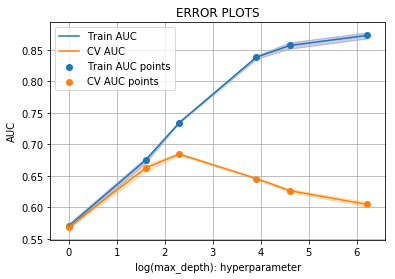

In [0]:
plt.plot(np.log(params['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(np.log(params['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']), cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(np.log(params['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(params['max_depth']), cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("log(max_depth): hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

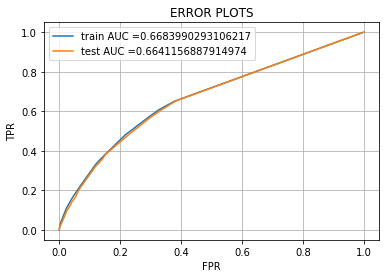

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier as DTC

clf = DTC(min_samples_split = 500, max_depth= 5, class_weight='balanced') #Best max_depth comes out to be 5 and min_samples_split = 500

clf.fit(X_train_bow, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = clf.predict_proba(X_train_bow)[:,1]
y_test_pred = clf.predict_proba(X_test_bow)[:,1]

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshold, fpr, tpr):
    
    t = threshold[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    #print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

Train confusion matrix


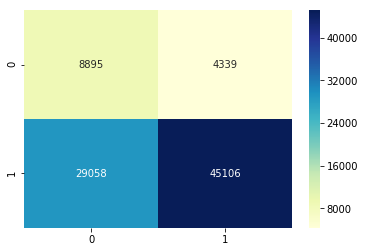

In [0]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
sns.heatmap(confusion_matrix(y_train, predict(y_train_pred, train_thresholds, train_fpr, train_tpr)), annot = True, fmt = "d", cmap="YlGnBu")


Test confusion matrix


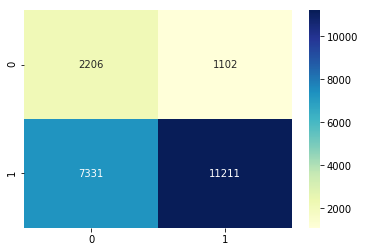

In [0]:
print("Test confusion matrix")
sns.heatmap(confusion_matrix(y_test, predict(y_test_pred, test_thresholds, test_fpr, test_tpr)), annot =True, fmt ="d", cmap="YlGnBu")

In [0]:
!pip3 install wordcloud

In [0]:
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, test_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(indices[0])

39750


In [0]:
text= []
for i  in range (0,len(indices)):
  text.append(project_data.preprocessed_essays[indices[i]])
 
all_text = []

all_text.append(''.join(text))

all_text

['my students creative clever enthusiastic while learning styles needs differ one thing common want learn i may not able control home lives i control experience school day from minute walk door classroom i focus potential growth by creative positive way i hopeful inspire every single one students continue path academic excellence think back last time research something most likely used technology help investigation this year 5th graders undertake multiple research projects learning presidential candidates exploring 50 states digital road trip it reason i hoping fund three chromebooks classroom by easy access chromebooks digital natives able explore learn create technology rich environment engages that type access technology classroom also provides opportunity teach students digital citizenship it important adequately prepare children society technology ubiquitous frequent consistent use chromebooks like ones i hopefully classroom allow teach students valuable lessons nannanmy students 

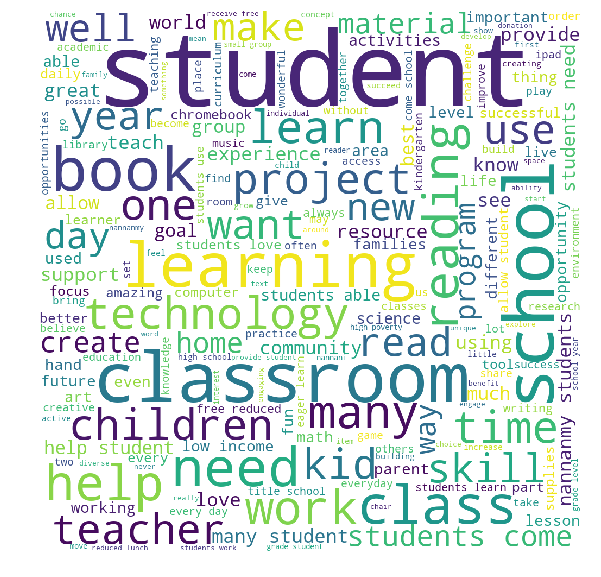

In [0]:
#FALSE POSITIVES
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, test_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

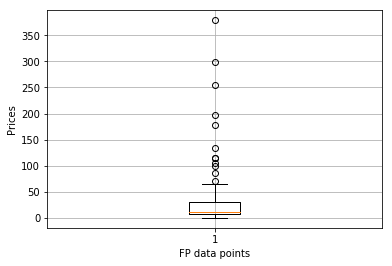

In [0]:
df2 = project_data.merge(resource_data, left_index = True, right_index = True)

prices= []
for i  in range (0,len(indices)):
  prices.append(df2.price[indices[i]])

  
plt.boxplot(prices[0:100])
plt.xlabel('FP data points')
plt.ylabel('Prices')
plt.grid()
plt.show()


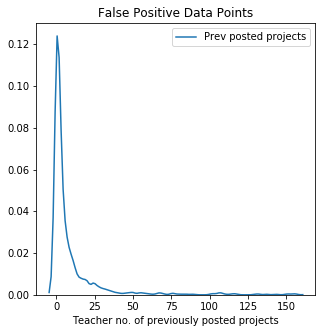

In [0]:
teacher_num = []
for i  in range (0,len(indices)):
  teacher_num.append(project_data.teacher_number_of_previously_posted_projects[indices[i]])

plt.figure(figsize=(5,5))
sns.distplot(teacher_num, hist=False, label="Prev posted projects")
plt.title('False Positive Data Points')
plt.xlabel('Teacher no. of previously posted projects')
plt.legend()
plt.show()

#### 2.4.1.1 Graphviz visualization of Decision Tree on BOW,<font color='red'> SET 1</font>

In [0]:
from sklearn import tree
!pip3 install graphviz

  Using cached https://files.pythonhosted.org/packages/1f/e2/ef2581b5b86625657afd32030f90cf2717456c1d2b711ba074bf007c0f1a/graphviz-0.10.1-py2.py3-none-any.whl


In [0]:
lst = []
lst.extend(y_train)
class_labels = []
for i in range(0,len(lst)):
    class_labels.append(str(lst[i]))

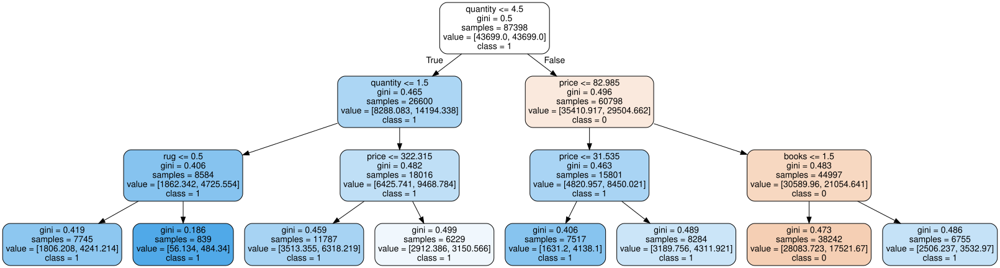

In [0]:
# Please write all the code with proper documentation
import graphviz

clf = DTC(min_samples_split = 500, max_depth= 3, class_weight='balanced')
clf.fit(X_train_bow, y_train)

dot_data = tree.export_graphviz(clf, out_file=None, feature_names = bow_feature_names, class_names= class_labels, rounded=True, filled=True)
graph = graphviz.Source(dot_data)
graph

### 2.4.2 Applying Decision Trees on TFIDF,<font color='red'> SET 2</font>

In [0]:
# Please write all the code with proper documentation
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV as RSCV
from sklearn.model_selection import GridSearchCV as GSCV
clf = DTC()
params = {'max_depth':[1, 5, 10, 50, 100, 500, 100],
          'min_samples_split':[5, 10, 15, 20, 30, 100, 200, 500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=6)
classifier.fit(X_train_tfidf, y_train)


Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   1 tasks      | elapsed:    4.2s
[Parallel(n_jobs=6)]: Done   2 tasks      | elapsed:    4.3s
[Parallel(n_jobs=6)]: Done   3 tasks      | elapsed:    4.5s
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:    4.6s
[Parallel(n_jobs=6)]: Done   5 tasks      | elapsed:    4.8s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    5.0s
[Parallel(n_jobs=6)]: Done   7 tasks      | elapsed:    6.5s
[Parallel(n_jobs=6)]: Done   8 tasks      | elapsed:    6.9s
[Parallel(n_jobs=6)]: Done   9 tasks      | elapsed:    7.0s
[Parallel(n_jobs=6)]: Done  10 tasks      | elapsed:    7.0s
[Parallel(n_jobs=6)]: Done  11 tasks      | elapsed:    7.2s
[Parallel(n_jobs=6)]: Done  12 tasks      | elapsed:    7.3s
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    8.8s
[Parallel(n_jobs=6)]: Done  14 tasks      | elapsed:    9.2s
[Parallel(n_jobs=6)]: Done  15 tasks      | elapsed:    9.3s
[Parallel(

[Parallel(n_jobs=6)]: Done 135 tasks      | elapsed: 31.9min
[Parallel(n_jobs=6)]: Done 136 tasks      | elapsed: 32.2min
[Parallel(n_jobs=6)]: Done 137 tasks      | elapsed: 32.4min
[Parallel(n_jobs=6)]: Done 138 tasks      | elapsed: 32.4min
[Parallel(n_jobs=6)]: Done 139 tasks      | elapsed: 33.5min
[Parallel(n_jobs=6)]: Done 140 tasks      | elapsed: 33.7min
[Parallel(n_jobs=6)]: Done 141 tasks      | elapsed: 34.1min
[Parallel(n_jobs=6)]: Done 142 tasks      | elapsed: 34.7min
[Parallel(n_jobs=6)]: Done 143 tasks      | elapsed: 34.7min
[Parallel(n_jobs=6)]: Done 144 tasks      | elapsed: 34.9min
[Parallel(n_jobs=6)]: Done 145 tasks      | elapsed: 36.5min
[Parallel(n_jobs=6)]: Done 146 tasks      | elapsed: 36.9min
[Parallel(n_jobs=6)]: Done 147 tasks      | elapsed: 37.1min
[Parallel(n_jobs=6)]: Done 148 tasks      | elapsed: 37.6min
[Parallel(n_jobs=6)]: Done 149 tasks      | elapsed: 37.8min
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed: 38.0min
[Parallel(n_jobs=6)]: Do

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=6,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500, 100], 'class_weight': ['balanced'], 'min_samples_split': [5, 10, 15, 20, 30, 100, 200, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)

[0.57007334 0.57007334 0.57007334 0.57007334 0.57007334 0.57007334
 0.57007334 0.57007334 0.67902687 0.67900665 0.67900665 0.6789797
 0.67892582 0.67889215 0.67875824 0.67831281 0.78012782 0.77832728
 0.77641492 0.77500196 0.77253328 0.76285327 0.75671517 0.74544726
 0.9801801  0.97262125 0.96589374 0.96071963 0.95291677 0.92208596
 0.90054013 0.85830453 0.99593514 0.99200597 0.98834526 0.98542081
 0.98035515 0.95696928 0.93608343 0.87996556 0.99995973 0.99889709
 0.99708799 0.99522544 0.99147023 0.97255021 0.95078866 0.89178375
 0.99549451 0.99173907 0.98842529 0.98533361 0.9790726  0.95748623
 0.9353396  0.88061342]
[0.56871528 0.56871528 0.56871528 0.56871528 0.56871528 0.56871528
 0.56871528 0.56871528 0.66143124 0.66146632 0.66150669 0.66149325
 0.66156335 0.66154988 0.66189858 0.66196311 0.67105231 0.67088534
 0.67063536 0.67068472 0.67091623 0.67402182 0.67735652 0.68107205
 0.5786749  0.58153902 0.58047532 0.58752862 0.59267692 0.60882357
 0.61631599 0.6311389  0.56508515 0.562

In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for tfidf encoded text features is,",best_params)

Best max_depth value for tfidf encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [0]:
### We found out that best min_samples_split is 500, so we grid search the data again with min_samples_split= 500
# so that we can plot train and cv auc with same x & y dimensions.

params = {'max_depth':[1, 5, 10, 50, 100, 500],
          'min_samples_split':[500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=6)
classifier.fit(X_train_tfidf, y_train)


Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   1 tasks      | elapsed:    2.2s
[Parallel(n_jobs=6)]: Done   2 tasks      | elapsed:    2.2s
[Parallel(n_jobs=6)]: Done   3 tasks      | elapsed:    2.3s
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:    8.0s
[Parallel(n_jobs=6)]: Done   5 tasks      | elapsed:    8.2s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    8.4s
[Parallel(n_jobs=6)]: Done   7 tasks      | elapsed:   20.5s
[Parallel(n_jobs=6)]: Done   9 out of  18 | elapsed:   23.4s remaining:   23.4s
[Parallel(n_jobs=6)]: Done  11 out of  18 | elapsed:  1.3min remaining:   51.2s
[Parallel(n_jobs=6)]: Done  13 out of  18 | elapsed:  1.7min remaining:   39.6s
[Parallel(n_jobs=6)]: Done  15 out of  18 | elapsed:  2.0min remaining:   24.2s
[Parallel(n_jobs=6)]: Done  18 out of  18 | elapsed:  3.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=6,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500], 'class_weight': ['balanced'], 'min_samples_split': [500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)

[0.57007334 0.67831281 0.74543563 0.85866684 0.88036361 0.89125361]
[0.56871528 0.66196311 0.68105192 0.63089854 0.60832875 0.59607336]


In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for tfidf encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


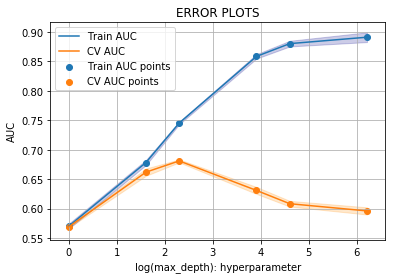

In [0]:
plt.plot(np.log(params['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(np.log(params['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']), cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(np.log(params['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(params['max_depth']), cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("log(max_depth): hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

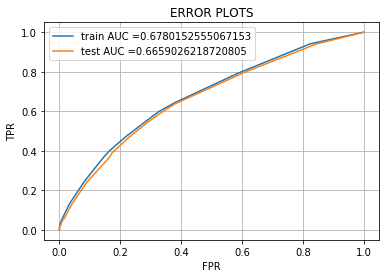

In [0]:
from sklearn.metrics import roc_curve, auc


clf = DTC(min_samples_split = 500, max_depth= 5, class_weight='balanced') #Best max_depth comes out to be 5 and
#min_samples_split= 500

clf.fit(X_train_tfidf, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = clf.predict_proba(X_train_tfidf)[:,1]
y_test_pred = clf.predict_proba(X_test_tfidf)[:,1]

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

Train confusion matrix


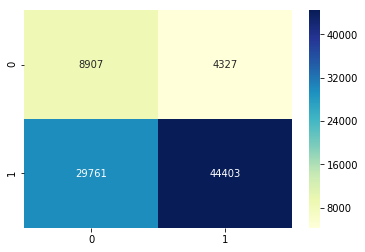

In [0]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
sns.heatmap(confusion_matrix(y_train, predict(y_train_pred, train_thresholds, train_fpr, train_tpr)), annot = True, fmt = "d", cmap="YlGnBu")


Test confusion matrix


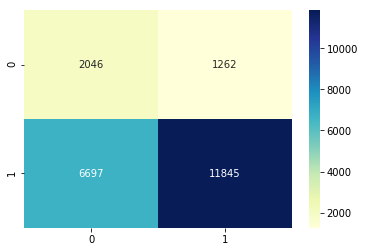

In [0]:
print("Test confusion matrix")
sns.heatmap(confusion_matrix(y_test, predict(y_test_pred, test_thresholds, test_fpr, test_tpr)), annot =True, fmt ="d", cmap="YlGnBu")

In [0]:
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, test_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(len(indices))

1262


In [0]:
text= []
for i  in range (0,len(indices)):
  text.append(project_data.preprocessed_essays[indices[i]])
 
all_text = []

all_text.append(''.join(text))

all_text

['taylorville high school ths primarily low income rural community serving 850 high school students wide demographic ths currently serves 137 students valid iep this course state required course where students aged 14 15 the units study include techniques budgeting banking check writing credit advertising awareness insurance i always searching new material trying stay date material students however i working small budget department need obtain new supplies unfortunately school district not situation offer monies needed i must seek elsewhere i give students date materials real life activities included items requested for example units include my budget my paycheck bills budgets bank accounts shopping smart personal finance trivia time i want students access everyday math money activities the items i requested excellent activities i use almost business education class some classes large i not always access computer labs chromebooks items copied used classroom i could also students work p

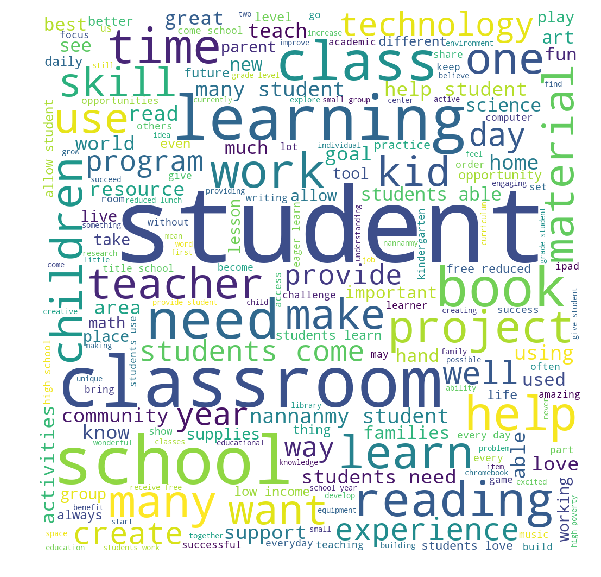

In [0]:
#FALSE POSITIVES WORDCLOUD

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

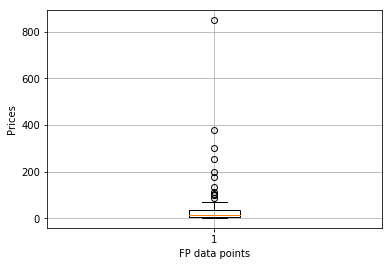

In [0]:
df2 = project_data.merge(resource_data, left_index = True, right_index = True)

prices= []
for i  in range (0,len(indices)):
  prices.append(df2.price[indices[i]])

  
plt.boxplot(prices[0:100])
plt.xlabel('FP data points')
plt.ylabel('Prices')
plt.grid()
plt.show()


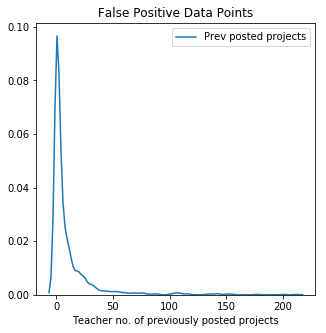

In [0]:
teacher_num = []
for i  in range (0,len(indices)):
  teacher_num.append(project_data.teacher_number_of_previously_posted_projects[indices[i]])

plt.figure(figsize=(5,5))
sns.distplot(teacher_num, hist=False, label="Prev posted projects")
plt.title('False Positive Data Points')
plt.xlabel('Teacher no. of previously posted projects')
plt.legend()
plt.show()

#### 2.4.2.1 Graphviz visualization of Decision Tree on TFIDF,<font color='red'> SET 2</font>

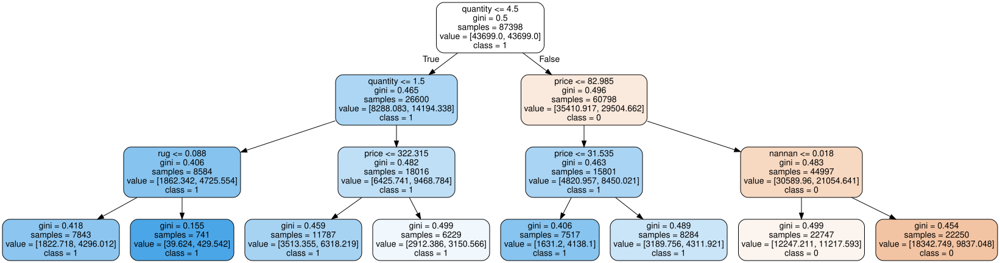

In [0]:
# Please write all the code with proper documentation
import graphviz

clf = DTC(min_samples_split = 500, max_depth= 3, class_weight='balanced')
clf.fit(X_train_tfidf, y_train)

dot_data = tree.export_graphviz(clf, out_file=None, feature_names = tfidf_feature_names, class_names= class_labels, rounded=True, filled=True)
graph = graphviz.Source(dot_data)
graph

### 2.4.3 Applying Decision Trees on AVG W2V,<font color='red'> SET 3</font>

In [0]:
# Please write all the code with proper documentation
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV as RSCV
from sklearn.model_selection import GridSearchCV as GSCV

clf = DTC()
params = {'max_depth':[1, 5, 10, 50, 100, 500, 100],
          'min_samples_split':[5, 10, 15, 20, 30, 100, 200, 500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=3)
classifier.fit(X_train_avg_w2v, y_train)


Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   1 tasks      | elapsed:   28.1s
[Parallel(n_jobs=3)]: Done   2 tasks      | elapsed:   28.2s
[Parallel(n_jobs=3)]: Done   3 tasks      | elapsed:   31.4s
[Parallel(n_jobs=3)]: Done   4 tasks      | elapsed:   47.5s
[Parallel(n_jobs=3)]: Done   5 tasks      | elapsed:   49.5s
[Parallel(n_jobs=3)]: Done   6 tasks      | elapsed:   53.6s
[Parallel(n_jobs=3)]: Done   7 tasks      | elapsed:  1.1min
[Parallel(n_jobs=3)]: Done   8 tasks      | elapsed:  1.1min
[Parallel(n_jobs=3)]: Done   9 tasks      | elapsed:  1.2min
[Parallel(n_jobs=3)]: Done  10 tasks      | elapsed:  1.5min
[Parallel(n_jobs=3)]: Done  11 tasks      | elapsed:  1.5min
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed:  1.7min
[Parallel(n_jobs=3)]: Done  13 tasks      | elapsed:  1.8min
[Parallel(n_jobs=3)]: Done  14 tasks      | elapsed:  1.9min
[Parallel(n_jobs=3)]: Done  15 tasks      | elapsed:  2.0min
[Parallel(

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500, 100], 'min_samples_split': [5, 10, 15, 20, 30, 100, 200, 500], 'class_weight': ['balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)


[0.57007334 0.57007334 0.57007334 0.57007334 0.57007334 0.57007334
 0.57007334 0.57007334 0.68693855 0.68691159 0.68691159 0.68691159
 0.68691159 0.68691159 0.68677637 0.6864167  0.8322418  0.83103131
 0.8297223  0.82804501 0.82401556 0.80434592 0.7892641  0.76099623
 0.99911377 0.99811641 0.99617396 0.99376721 0.9875905  0.9285512
 0.87268066 0.78744474 0.99996523 0.99953105 0.99832239 0.99607153
 0.99052411 0.93389732 0.87473822 0.78772498 0.99997299 0.99952161
 0.99827949 0.99616962 0.99055522 0.93364443 0.87505426 0.78782419
 0.99996467 0.99949491 0.99825212 0.99623052 0.99070359 0.93361796
 0.87436461 0.78761623]
[0.56871528 0.56871528 0.56871528 0.56871528 0.56871528 0.56871528
 0.56871528 0.56871528 0.66418767 0.66417419 0.66417419 0.66417419
 0.66417419 0.66417419 0.66415358 0.6641863  0.63156212 0.6310203
 0.63135965 0.63119899 0.63106037 0.63884778 0.64409003 0.65541006
 0.54564258 0.5454802  0.55092145 0.55141794 0.55402979 0.5780671
 0.59975388 0.64098449 0.54094844 0.54172

In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for avg_w2v encoded text features is,",best_params)


Best max_depth value for avg_w2v encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [0]:
### We found out that best min_samples_split is 5, so we grid search the data again with min_samples_split= 5
# so that we can plot train and cv auc with same x & y dimensions.

params = {'max_depth':[1, 5, 10, 50, 100, 500],
          'min_samples_split':[5],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=3)
classifier.fit(X_train_avg_w2v, y_train)


Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   1 tasks      | elapsed:   26.2s
[Parallel(n_jobs=3)]: Done   2 tasks      | elapsed:   27.7s
[Parallel(n_jobs=3)]: Done   3 tasks      | elapsed:   29.2s
[Parallel(n_jobs=3)]: Done   4 tasks      | elapsed:  1.8min
[Parallel(n_jobs=3)]: Done   5 tasks      | elapsed:  1.8min
[Parallel(n_jobs=3)]: Done   6 tasks      | elapsed:  1.9min
[Parallel(n_jobs=3)]: Done   7 tasks      | elapsed:  5.5min
[Parallel(n_jobs=3)]: Done   8 tasks      | elapsed:  5.5min
[Parallel(n_jobs=3)]: Done   9 tasks      | elapsed:  5.6min
[Parallel(n_jobs=3)]: Done  10 tasks      | elapsed: 14.4min
[Parallel(n_jobs=3)]: Done  11 tasks      | elapsed: 15.2min
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed: 15.2min
[Parallel(n_jobs=3)]: Done  13 tasks      | elapsed: 24.0min
[Parallel(n_jobs=3)]: Done  15 out of  18 | elapsed: 25.9min remaining:  5.2min
[Parallel(n_jobs=3)]: Done  18 out of  18 | elapsed:

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500], 'min_samples_split': [5], 'class_weight': ['balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)


[0.57007334 0.68693855 0.83224208 0.99912128 0.99997167 0.99997179]
[0.56871528 0.66418767 0.63180559 0.5423992  0.54277282 0.54084197]


In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for avg_w2v encoded text features is,",best_params)


Best max_depth value for avg_w2v encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


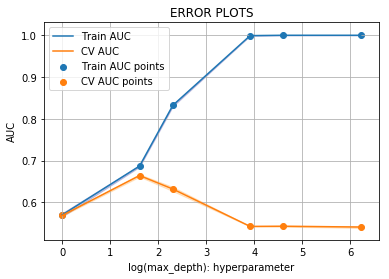

In [0]:
plt.plot(np.log(params['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(np.log(params['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']), cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(np.log(params['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(params['max_depth']), cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("log(max_depth): hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


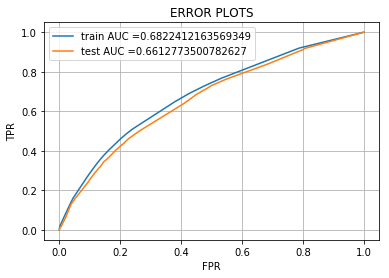

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier as DTC

clf = DTC(min_samples_split = 5, max_depth= 5, class_weight='balanced') #Best max_depth comes out to be 5 and min_samples_split = 5

clf.fit(X_train_avg_w2v, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = clf.predict_proba(X_train_avg_w2v)[:,1]
y_test_pred = clf.predict_proba(X_test_avg_w2v)[:,1]

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


Train confusion matrix


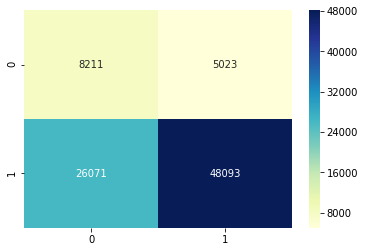

In [0]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
sns.heatmap(confusion_matrix(y_train, predict(y_train_pred, train_thresholds, train_fpr, train_tpr)), annot = True, fmt = "d", cmap="YlGnBu")


Test confusion matrix


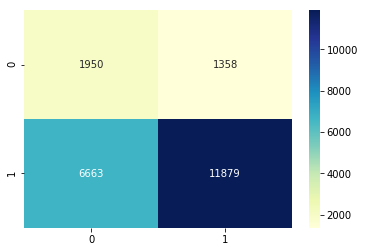

In [0]:
print("Test confusion matrix")
sns.heatmap(confusion_matrix(y_test, predict(y_test_pred, test_thresholds, test_fpr, test_tpr)), annot =True, fmt ="d", cmap="YlGnBu")


In [0]:
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, test_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(len(indices))


1358


In [0]:
text= []
for i  in range (0,len(indices)):
  text.append(project_data.preprocessed_essays[indices[i]])
 
all_text = []

all_text.append(''.join(text))

all_text


['i teach 3rd grade fast growing suburb salt lake city we year round school our students wide variety economic backgrounds we single family homes town homes apartments schools boundary it high density housing area fast growing city herriman my class ready eager learn we wide range ability levels students progressing excited school we great start 7 weeks school year already completed we many services programs place help students successful specific resources individual student needs levels sometimes hard come this year i really need language arts material entire class reading levels wide range i would appreciate reading material stories beginning readers phonics manipulatives facilitate learning understanding hands all hands on deck allow students level appropriate lessons activities fit individual need manipulatives help students learn best method retention learning guided reading improved supplies meet individual levels i trying meet students needs student growth main goal i want stud

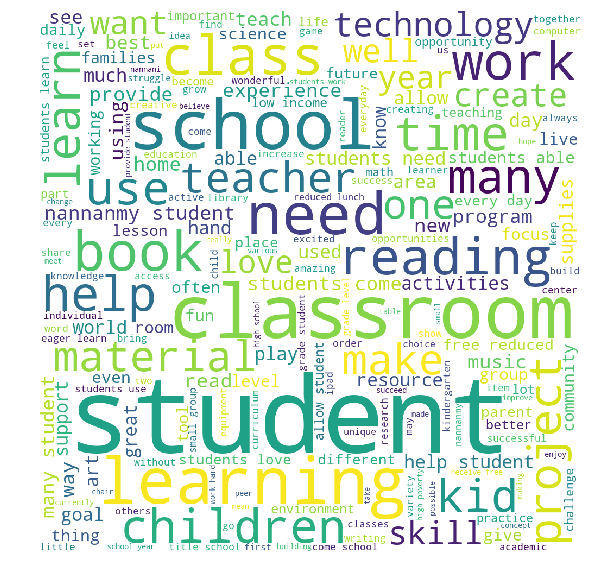

In [0]:
#FALSE POSITIVES WORDCLOUD

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()



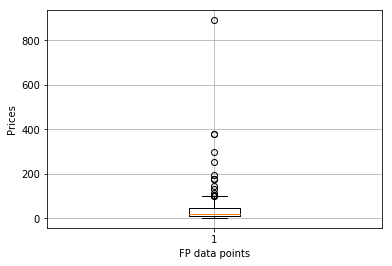

In [0]:
df2 = project_data.merge(resource_data, left_index = True, right_index = True)

prices= []
for i  in range (0,len(indices)):
  prices.append(df2.price[indices[i]])

  
plt.boxplot(prices[0:100])
plt.xlabel('FP data points')
plt.ylabel('Prices')
plt.grid()
plt.show()

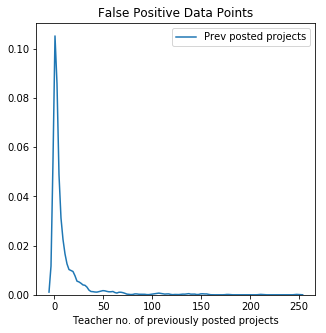

In [0]:
teacher_num = []
for i  in range (0,len(indices)):
  teacher_num.append(project_data.teacher_number_of_previously_posted_projects[indices[i]])

plt.figure(figsize=(5,5))
sns.distplot(teacher_num, hist=False, label="Prev posted projects")
plt.title('False Positive Data Points')
plt.xlabel('Teacher no. of previously posted projects')
plt.legend()
plt.show()

### 2.4.4 Applying Decision Trees on TFIDF W2V,<font color='red'> SET 4</font>

In [0]:
# Please write all the code with proper documentation
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV as RSCV
from sklearn.model_selection import GridSearchCV as GSCV

clf = DTC()
params = {'max_depth':[1, 5, 10, 50, 100, 500],
          'min_samples_split':[5, 10, 15, 20, 30, 100, 200, 500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=3)
classifier.fit(X_train_tfidf_w2v, y_train)


Fitting 3 folds for each of 48 candidates, totalling 144 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   1 tasks      | elapsed:   21.6s
[Parallel(n_jobs=3)]: Done   2 tasks      | elapsed:   25.0s
[Parallel(n_jobs=3)]: Done   3 tasks      | elapsed:   25.4s
[Parallel(n_jobs=3)]: Done   4 tasks      | elapsed:   41.4s
[Parallel(n_jobs=3)]: Done   5 tasks      | elapsed:   42.4s
[Parallel(n_jobs=3)]: Done   6 tasks      | elapsed:   44.9s
[Parallel(n_jobs=3)]: Done   7 tasks      | elapsed:   58.7s
[Parallel(n_jobs=3)]: Done   8 tasks      | elapsed:   59.4s
[Parallel(n_jobs=3)]: Done   9 tasks      | elapsed:  1.1min
[Parallel(n_jobs=3)]: Done  10 tasks      | elapsed:  1.3min
[Parallel(n_jobs=3)]: Done  11 tasks      | elapsed:  1.3min
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed:  1.4min
[Parallel(n_jobs=3)]: Done  13 tasks      | elapsed:  1.6min
[Parallel(n_jobs=3)]: Done  14 tasks      | elapsed:  1.6min
[Parallel(n_jobs=3)]: Done  15 tasks      | elapsed:  1.7min
[Parallel(

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 15, 20, 30, 100, 200, 500], 'class_weight': ['balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)


[0.57007334 0.57007334 0.57007334 0.57007334 0.57007334 0.57007334
 0.57007334 0.57007334 0.6846356  0.6846356  0.6846356  0.6846356
 0.6846356  0.6846356  0.68449485 0.68439157 0.83338076 0.8320397
 0.82975084 0.8279681  0.82365224 0.80639774 0.78842677 0.75733164
 0.99931007 0.99838721 0.99662257 0.99463967 0.98795005 0.92890373
 0.86586856 0.78179406 0.99997058 0.9995233  0.99823445 0.99625069
 0.99056244 0.93214275 0.86598337 0.7815706  0.999971   0.99953208
 0.99821768 0.9962538  0.99051347 0.93183511 0.86584935 0.78149943]
[0.56871528 0.56871528 0.56871528 0.56871528 0.56871528 0.56871528
 0.56871528 0.56871528 0.66212744 0.66212744 0.66212744 0.66212744
 0.66212744 0.66212744 0.66227127 0.66223962 0.62363304 0.62305912
 0.62208942 0.62234443 0.62190885 0.62803148 0.63470139 0.64630521
 0.53958248 0.5413483  0.54273119 0.54625331 0.55201435 0.5713739
 0.59344085 0.63095483 0.53776946 0.54074839 0.53977538 0.54487413
 0.54867135 0.56737347 0.59271061 0.63108458 0.53986254 0.541602

In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for tfidfv_w2v encoded text features is,",best_params)


Best max_depth value for tfidfv_w2v encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=200,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [0]:
### We found out that best min_samples_split is 200, so we grid search the data again with min_samples_split= 200
# so that we can plot train and cv auc with same x & y dimensions.
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV as RSCV
from sklearn.model_selection import GridSearchCV as GSCV

clf = DTC()

params = {'max_depth':[1, 5, 10, 50, 100, 500],
          'min_samples_split':[200],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=3)
classifier.fit(X_train_tfidf_w2v, y_train)


Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   1 tasks      | elapsed:   24.8s
[Parallel(n_jobs=3)]: Done   2 tasks      | elapsed:   25.0s
[Parallel(n_jobs=3)]: Done   3 tasks      | elapsed:   29.9s
[Parallel(n_jobs=3)]: Done   4 tasks      | elapsed:  1.7min
[Parallel(n_jobs=3)]: Done   5 tasks      | elapsed:  1.8min
[Parallel(n_jobs=3)]: Done   6 tasks      | elapsed:  1.8min
[Parallel(n_jobs=3)]: Done   7 tasks      | elapsed:  5.2min
/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[Parallel(n_jobs=3)]: Done   8 tasks      | elapsed:  5.5min
/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning:

A worker stopped while some jobs were given to the executor. This can

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500], 'min_samples_split': [200], 'class_weight': ['balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)


[0.57007334 0.68449485 0.78833891 0.86511892 0.86541073 0.86590169]
[0.56871528 0.66227127 0.63476257 0.59333084 0.5935821  0.59294414]


In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for tfidf_w2v encoded text features is,",best_params)


Best max_depth value for tfidf_w2v encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=200,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


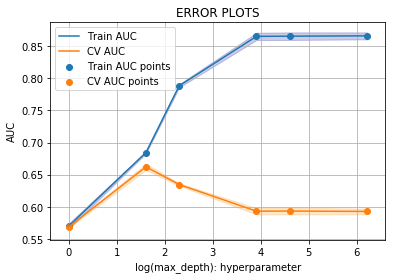

In [0]:
plt.plot(np.log(params['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(np.log(params['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']), cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(np.log(params['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(params['max_depth']), cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("log(max_depth): hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


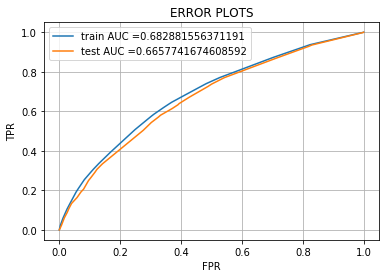

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier as DTC

clf = DTC(min_samples_split = 200, max_depth= 5, class_weight='balanced') #Best max_depth comes out to be 5 and min_samples_split = 200

clf.fit(X_train_tfidf_w2v, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = clf.predict_proba(X_train_tfidf_w2v)[:,1]
y_test_pred = clf.predict_proba(X_test_tfidf_w2v)[:,1]

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


Train confusion matrix


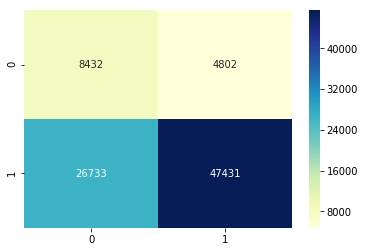

In [0]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
sns.heatmap(confusion_matrix(y_train, predict(y_train_pred, train_thresholds, train_fpr, train_tpr)), annot = True, fmt = "d", cmap="YlGnBu")


Test confusion matrix


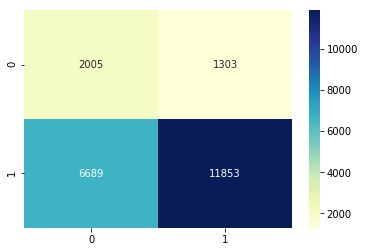

In [0]:
print("Test confusion matrix")
sns.heatmap(confusion_matrix(y_test, predict(y_test_pred, test_thresholds, test_fpr, test_tpr)), annot =True, fmt ="d", cmap="YlGnBu")


In [0]:
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, test_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(len(indices))


1303


In [0]:
text= []
for i  in range (0,len(indices)):
  text.append(project_data.preprocessed_essays[indices[i]])
 
all_text = []

all_text.append(''.join(text))

all_text


['taylorville high school ths primarily low income rural community serving 850 high school students wide demographic ths currently serves 137 students valid iep this course state required course where students aged 14 15 the units study include techniques budgeting banking check writing credit advertising awareness insurance i always searching new material trying stay date material students however i working small budget department need obtain new supplies unfortunately school district not situation offer monies needed i must seek elsewhere i give students date materials real life activities included items requested for example units include my budget my paycheck bills budgets bank accounts shopping smart personal finance trivia time i want students access everyday math money activities the items i requested excellent activities i use almost business education class some classes large i not always access computer labs chromebooks items copied used classroom i could also students work p

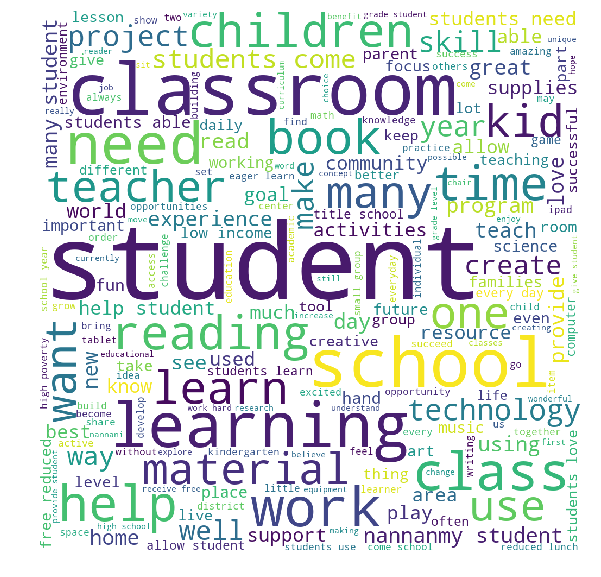

In [0]:
#FALSE POSITIVES
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, test_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()


In [0]:
df2 = project_data.merge(resource_data, left_index = True, right_index = True)

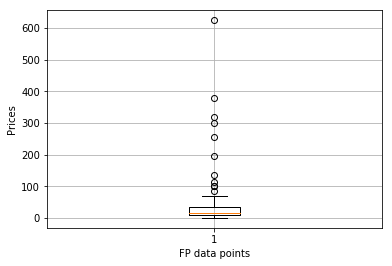

In [0]:
prices= []
for i  in range (0,len(indices)):
  prices.append(df2.price[indices[i]])

  
plt.boxplot(prices[0:100])
plt.xlabel('FP data points')
plt.ylabel('Prices')
plt.grid()
plt.show()

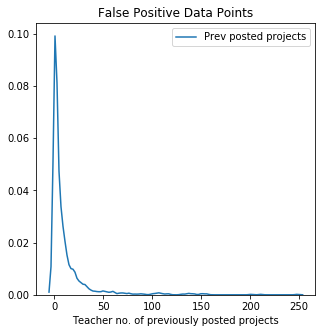

In [0]:
teacher_num = []
for i  in range (0,len(indices)):
  teacher_num.append(project_data.teacher_number_of_previously_posted_projects[indices[i]])

plt.figure(figsize=(5,5))
sns.distplot(teacher_num, hist=False, label="Prev posted projects")
plt.title('False Positive Data Points')
plt.xlabel('Teacher no. of previously posted projects')
plt.legend()
plt.show()


<h2>2.5 [Task-2]Getting top 5k features using `feature_importances_`</h2>

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label
    
def selectKImportance(model, X, k):
     return X[:,model.feature_importances_.argsort()[::-1][:k]]
  
  
clf.fit(X_train_tfidf,y_train)

impdf = selectKImportance(clf,X_train_tfidf,5000)
impdf.shape


(87398, 5000)

In [0]:
clf.fit(X_test_tfidf,y_test)

impdf_test = selectKImportance(clf,X_test_tfidf,5000)
impdf_test.shape

(21850, 5000)

In [0]:
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV as RSCV
from sklearn.model_selection import GridSearchCV as GSCV

clf = DTC()
params = {'max_depth':[1, 5, 10, 50, 100, 500, 100],
          'min_samples_split':[5, 10, 15, 20, 30, 100, 200, 500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=6)
classifier.fit(impdf, y_train)


Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   1 tasks      | elapsed:    8.5s
[Parallel(n_jobs=6)]: Done   2 tasks      | elapsed:    8.7s
[Parallel(n_jobs=6)]: Done   3 tasks      | elapsed:    9.2s
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:   10.2s
[Parallel(n_jobs=6)]: Done   5 tasks      | elapsed:   10.3s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:   14.5s
[Parallel(n_jobs=6)]: Done   7 tasks      | elapsed:   14.7s
[Parallel(n_jobs=6)]: Done   8 tasks      | elapsed:   15.3s
[Parallel(n_jobs=6)]: Done   9 tasks      | elapsed:   16.0s
[Parallel(n_jobs=6)]: Done  10 tasks      | elapsed:   16.5s
[Parallel(n_jobs=6)]: Done  11 tasks      | elapsed:   18.3s
[Parallel(n_jobs=6)]: Done  12 tasks      | elapsed:   20.4s
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:   20.8s
[Parallel(n_jobs=6)]: Done  14 tasks      | elapsed:   21.5s
[Parallel(n_jobs=6)]: Done  15 tasks      | elapsed:   21.8s
[Parallel(

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=6,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500, 100], 'min_samples_split': [5, 10, 15, 20, 30, 100, 200, 500], 'class_weight': ['balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)


[0.57007334 0.57007334 0.57007334 0.57007334 0.57007334 0.57007334
 0.57007334 0.57007334 0.67867964 0.67865271 0.67865271 0.67862577
 0.67852493 0.67849126 0.67837379 0.67796405 0.77151574 0.76970665
 0.76807512 0.76662322 0.76454561 0.75601754 0.75099166 0.74300141
 0.97879478 0.96981899 0.96251553 0.95679211 0.94692512 0.91296242
 0.89130872 0.85139128 0.99396955 0.98984484 0.98484202 0.98194921
 0.97522464 0.94815045 0.92240328 0.87240501 0.99991224 0.99842663
 0.99618426 0.99385885 0.98946377 0.96605059 0.94134634 0.882713
 0.99411525 0.98980224 0.98548    0.981504   0.97532467 0.94731822
 0.92345327 0.87144467]
[0.56871528 0.56871528 0.56871528 0.56871528 0.56871528 0.56871528
 0.56871528 0.56871528 0.6622806  0.66226266 0.66223572 0.66235972
 0.66225216 0.66225216 0.66222535 0.66229936 0.67442807 0.67373508
 0.67316488 0.67354315 0.67340873 0.67665716 0.6782339  0.6804776
 0.58592927 0.58422464 0.58837597 0.59322257 0.59925666 0.61721654
 0.62219793 0.63081038 0.57006286 0.57145

In [0]:
best_params = classifier.best_estimator_
print("Best max_depth value for tfidf encoded top 5000 features is,",best_params)


Best max_depth value for tfidf encoded top 5000 features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [0]:
### We found out that best min_samples_split is 500, so we grid search the data again with min_samples_split= 500
# so that we can plot train and cv auc with same x & y dimensions.

params = {'max_depth':[1, 5, 10, 50, 100, 500],
          'min_samples_split':[500],
          'class_weight':['balanced']
          }
#Hyperparameter search
classifier = GSCV(clf, params, cv = 3, scoring ='roc_auc', verbose = 15, n_jobs=6)
classifier.fit(impdf, y_train)


Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   1 tasks      | elapsed:    4.8s
[Parallel(n_jobs=6)]: Done   2 tasks      | elapsed:    5.0s
[Parallel(n_jobs=6)]: Done   3 tasks      | elapsed:    5.1s
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:   19.8s
[Parallel(n_jobs=6)]: Done   5 tasks      | elapsed:   22.0s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:   25.2s
[Parallel(n_jobs=6)]: Done   7 tasks      | elapsed:   47.5s
[Parallel(n_jobs=6)]: Done   9 out of  18 | elapsed:   48.8s remaining:   48.8s
[Parallel(n_jobs=6)]: Done  11 out of  18 | elapsed:  2.5min remaining:  1.6min
[Parallel(n_jobs=6)]: Done  13 out of  18 | elapsed:  3.5min remaining:  1.4min
[Parallel(n_jobs=6)]: Done  15 out of  18 | elapsed:  3.7min remaining:   44.6s
[Parallel(n_jobs=6)]: Done  18 out of  18 | elapsed:  4.6min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=6,
       param_grid={'max_depth': [1, 5, 10, 50, 100, 500], 'min_samples_split': [500], 'class_weight': ['balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=15)

In [0]:
train_auc= classifier.cv_results_['mean_train_score']
train_auc_std= classifier.cv_results_['std_train_score']
print(train_auc)

#Scores of Cross-validation set for different hyperparameters
cv_auc= classifier.cv_results_['mean_test_score']
cv_auc_std= classifier.cv_results_['std_test_score']
print(cv_auc)


[0.57007334 0.67796405 0.74300141 0.84940866 0.87123587 0.88080622]
[0.56871528 0.66229936 0.68058076 0.63363202 0.61536494 0.59997001]


In [0]:
#display the best params
best_params = classifier.best_estimator_
print("Best max_depth value for tfidf encoded top 5000 features is,",best_params)


Best max_depth value for tfidf encoded top 5000 features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


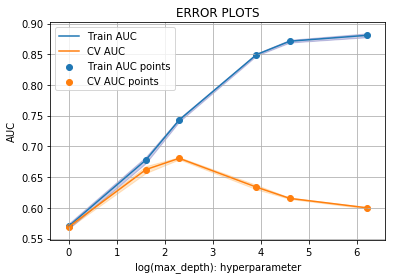

In [0]:
plt.plot(np.log(params['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(np.log(params['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(params['max_depth']), cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(np.log(params['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(params['max_depth']), cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("log(max_depth): hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


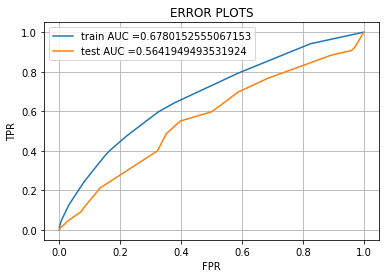

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier as DTC

clf = DTC(min_samples_split = 500, max_depth= 5, class_weight='balanced') #Best max_depth comes out to be 5 and min_samples_split = 500

clf.fit(impdf, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = clf.predict_proba(impdf)[:,1]
y_test_pred = clf.predict_proba(impdf_test)[:,1]

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


<h1>3. Conclusion</h1>

In [0]:
# Please compare all your models using Prettytable library

In [0]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectorizer","Hyper-parameter(Max_depth)","AUC"]
x.add_row(["BOW",5, 0.66415])
x.add_row(["TFIDF",5, 0.6659])
x.add_row(["Avg_W2V",5, 0.6612])
x.add_row(["TFIDF_W2V",5, 0.6657])
x.add_row(["TFIDF_5000_best_features",5,0.564])
print(x)

+--------------------------+----------------------------+---------+
|        Vectorizer        | Hyper-parameter(Max_depth) |   AUC   |
+--------------------------+----------------------------+---------+
|           BOW            |             5              | 0.66415 |
|          TFIDF           |             5              |  0.6659 |
|         Avg_W2V          |             5              |  0.6612 |
|        TFIDF_W2V         |             5              |  0.6657 |
| TFIDF_5000_best_features |             5              |  0.564  |
+--------------------------+----------------------------+---------+
